### 1. 이벤트 선정

시장 대비 수익률이 -5% 인 날짜 필터링

In [3]:
import pandas as pd

# 1. 파일 불러오기 (CSV 파일은 같은 폴더에 위치)
sm = pd.read_csv('041510 과거 데이터.csv')         # 컬럼: 날짜, 종가
kosdaq = pd.read_csv('코스닥 과거 데이터.csv')       # 컬럼: 날짜, 지수

# 2. 날짜 형식 통일
sm['날짜'] = pd.to_datetime(sm['날짜'].str.replace(" ", ""), format='%Y-%m-%d')
kosdaq['날짜'] = pd.to_datetime(kosdaq['날짜'].str.replace(" ", ""), format='%Y-%m-%d')

# 3. 종가, 지수에서 쉼표 제거 후 숫자로 변환
sm['종가'] = sm['종가'].str.replace(",", "").astype(float)
kosdaq['종가'] = kosdaq['종가'].str.replace(",", "").astype(float)

# 4. 날짜 기준 정렬
sm = sm.sort_values('날짜')
kosdaq = kosdaq.sort_values('날짜')

# 5. 일일 수익률 계산
sm['return'] = sm['종가'].pct_change()
kosdaq['return'] = kosdaq['종가'].pct_change()

# 6. 날짜 기준으로 병합
df = pd.merge(sm[['날짜', 'return']], kosdaq[['날짜', 'return']], on='날짜', suffixes=('_sm', '_kosdaq'))

# 7. Abnormal Return 계산
df['abnormal_return'] = df['return_sm'] - df['return_kosdaq']

# 8. ±5% 이상일 경우 이벤트 후보로 설정
# event_candidates = df[df['abnormal_return'].abs() >= 0.05].copy()
event_candidates = df[df['abnormal_return'] <= -0.05].copy()
event_candidates = event_candidates[['날짜', 'abnormal_return']]

# 9. 연속된 날짜 묶기: 3일 이내는 하나의 이벤트로 간주
# 연속된 날짜를 하나의 이벤트 그룹으로 묶고, 그 그룹의 첫 번째 날짜를 대표 날짜(event_date)로 사용
event_candidates['diff'] = event_candidates['날짜'].diff().dt.days
event_candidates['event_group'] = (event_candidates['diff'] > 3).cumsum()

# 10. 이벤트 대표 날짜 뽑기 (각 그룹의 첫 번째 날짜)
event_dates = event_candidates.groupby('event_group').first().reset_index()
event_dates = event_dates[['날짜', 'abnormal_return']]
event_dates.rename(columns={'날짜': 'event_date'}, inplace=True)

# 11. 결과 출력
print("📌 추출된 이벤트 날짜 목록:")
print(event_dates)


📌 추출된 이벤트 날짜 목록:
   event_date  abnormal_return
0  2014-05-15        -0.060821
1  2014-06-03        -0.056279
2  2014-06-11        -0.073300
3  2014-10-10        -0.129665
4  2014-11-04        -0.082441
5  2015-02-09        -0.059101
6  2015-11-10        -0.071683
7  2016-07-29        -0.054031
8  2016-11-21        -0.063939
9  2018-04-04        -0.051516
10 2018-10-24        -0.123471
11 2019-01-23        -0.058880
12 2019-03-11        -0.109096
13 2019-08-01        -0.067941
14 2020-01-28        -0.055669
15 2020-03-20        -0.068297
16 2020-07-22        -0.059013
17 2020-08-21        -0.051368
18 2020-10-05        -0.065146
19 2021-03-12        -0.056987
20 2021-06-04        -0.066513
21 2021-06-08        -0.056847
22 2021-10-07        -0.057982
23 2021-10-18        -0.055435
24 2021-10-28        -0.052630
25 2021-11-18        -0.057417
26 2022-03-17        -0.078070
27 2022-04-04        -0.050250
28 2022-04-18        -0.055459
29 2022-05-09        -0.053258
30 2022-08-17        -

워드클라우드 관련 라이브러리 설치

In [10]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
pip install eunjeon

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
from datetime import timedelta
import urllib.parse
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import re
from eunjeon import Mecab
import time

### 2. 이벤트 날짜별로 워드 클라우드 생성

이때 키워드는 `소속사 영문 이름`으로 설정하여 서치

word_dict로 텍스트 유사도 측정도 가능 (아직 계획 없음)

일단은시각적으로 어느정도 확인 가능하다는 의미 정도


📆 2014-05-15 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2014.05.15&de=2014.05.16&nso=so:r,p:from20140515to20140516,a:all&start=41


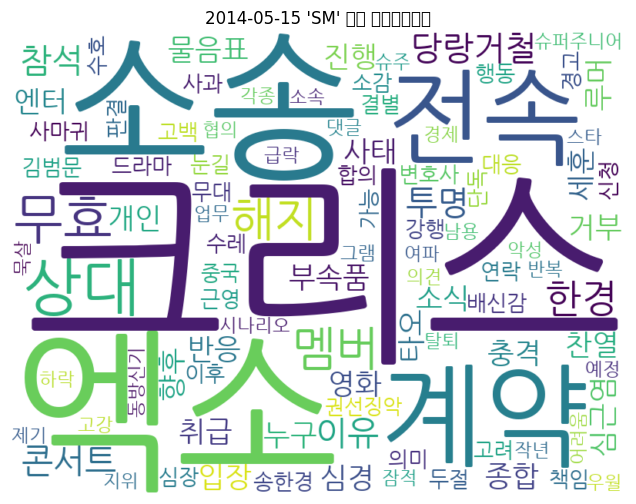


📆 2014-06-03 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2014.06.03&de=2014.06.04&nso=so:r,p:from20140603to20140604,a:all&start=41


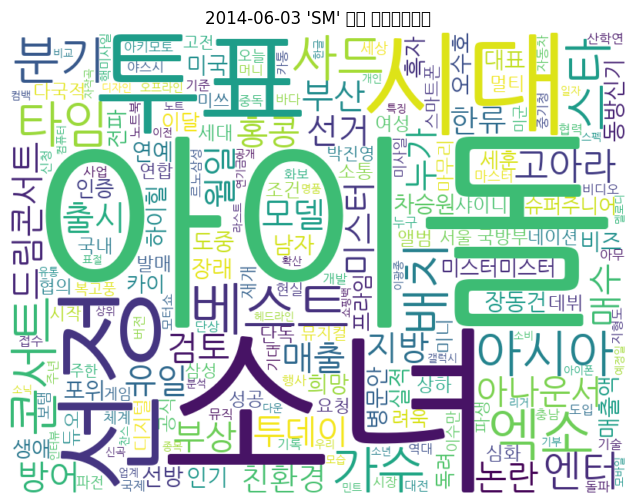


📆 2014-06-11 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2014.06.11&de=2014.06.12&nso=so:r,p:from20140611to20140612,a:all&start=41


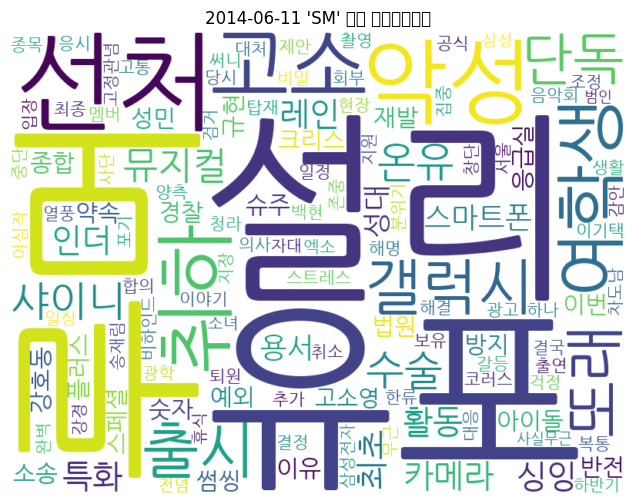


📆 2014-10-10 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2014.10.10&de=2014.10.11&nso=so:r,p:from20141010to20141011,a:all&start=41


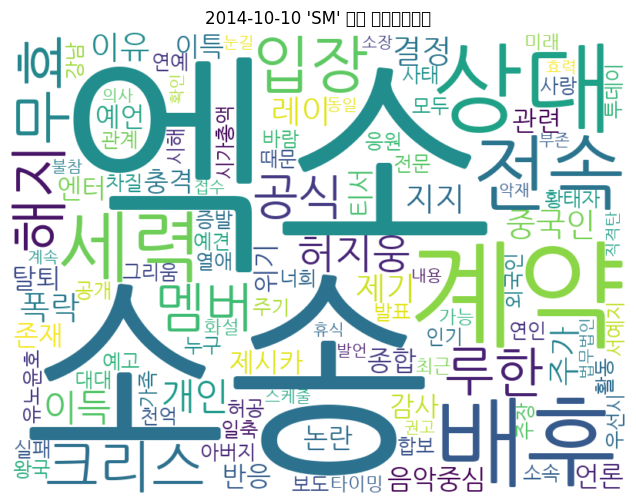


📆 2014-11-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2014.11.04&de=2014.11.05&nso=so:r,p:from20141104to20141105,a:all&start=41


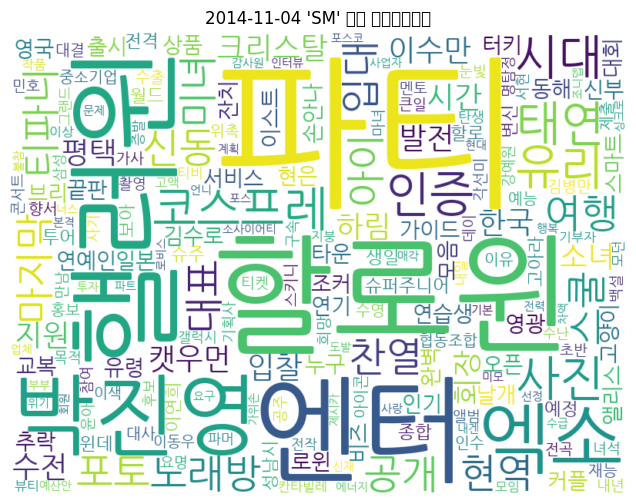


📆 2015-02-09 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2015.02.09&de=2015.02.10&nso=so:r,p:from20150209to20150210,a:all&start=41


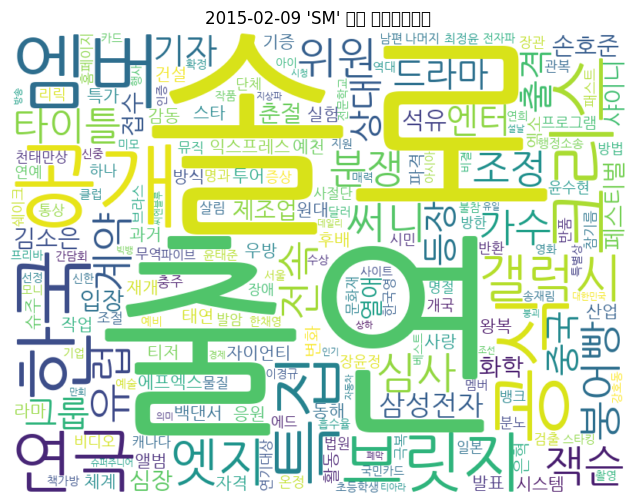


📆 2015-11-10 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2015.11.10&de=2015.11.11&nso=so:r,p:from20151110to20151111,a:all&start=41


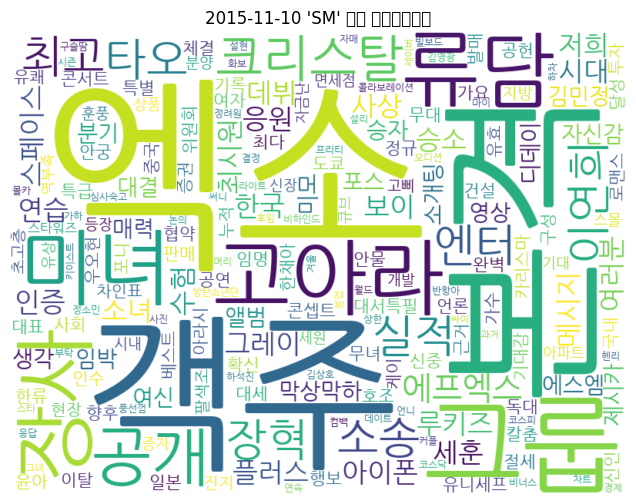


📆 2016-07-29 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2016.07.29&de=2016.07.30&nso=so:r,p:from20160729to20160730,a:all&start=41


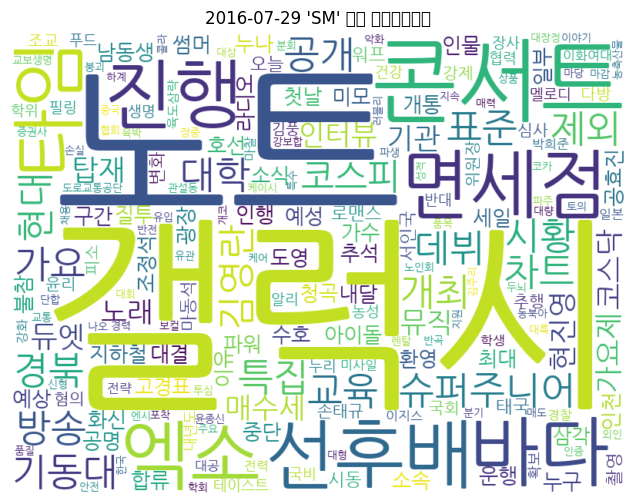


📆 2016-11-21 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2016.11.21&de=2016.11.22&nso=so:r,p:from20161121to20161122,a:all&start=41


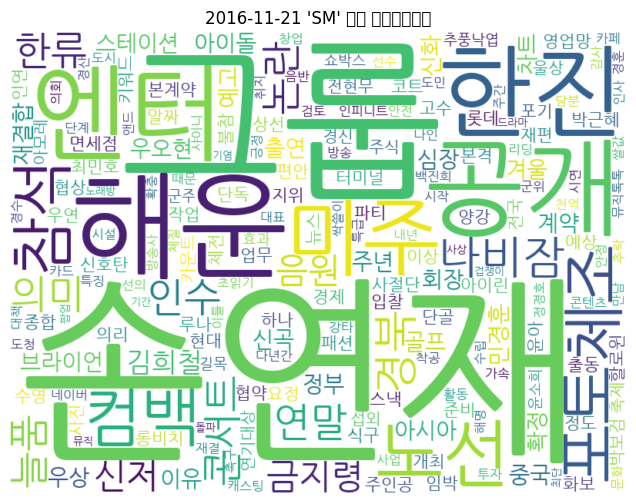


📆 2018-04-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2018.04.04&de=2018.04.05&nso=so:r,p:from20180404to20180405,a:all&start=41


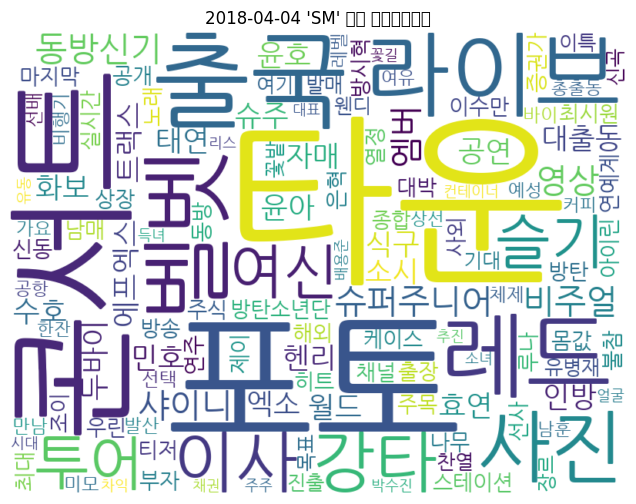


📆 2018-10-24 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2018.10.24&de=2018.10.25&nso=so:r,p:from20181024to20181025,a:all&start=41


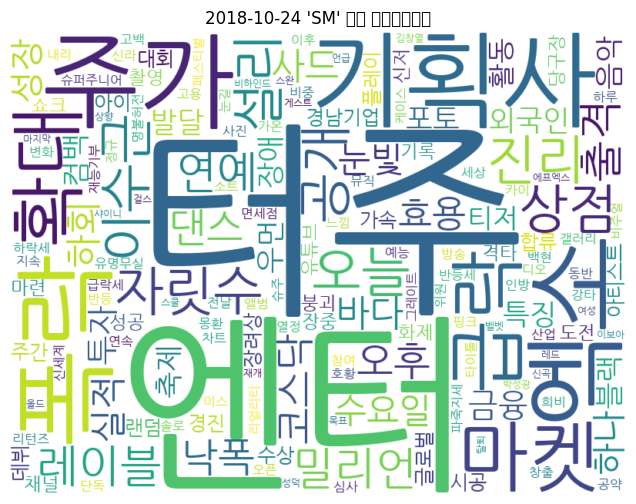


📆 2019-01-23 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2019.01.23&de=2019.01.24&nso=so:r,p:from20190123to20190124,a:all&start=41


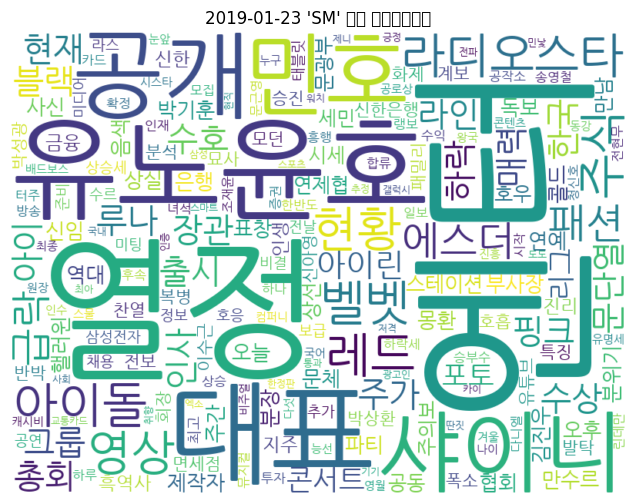


📆 2019-03-11 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2019.03.11&de=2019.03.12&nso=so:r,p:from20190311to20190312,a:all&start=41


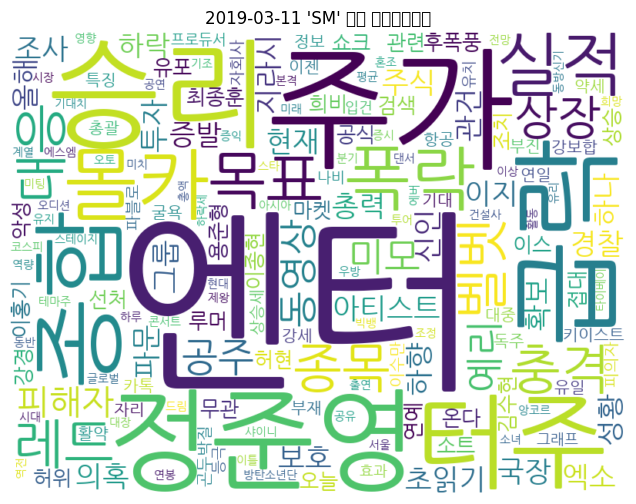


📆 2019-08-01 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2019.08.01&de=2019.08.02&nso=so:r,p:from20190801to20190802,a:all&start=41


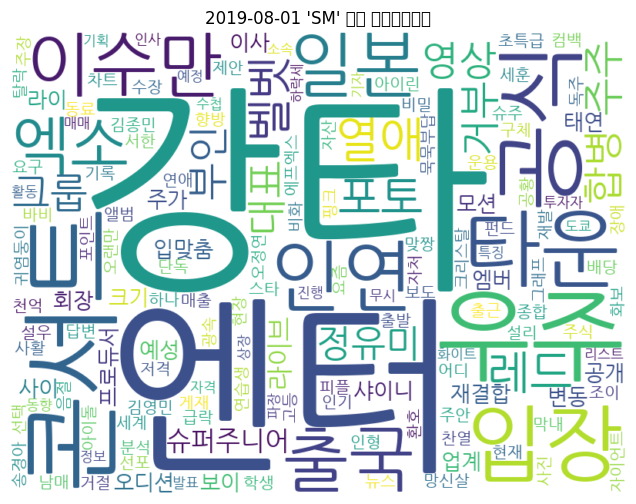


📆 2020-01-28 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2020.01.28&de=2020.01.29&nso=so:r,p:from20200128to20200129,a:all&start=41


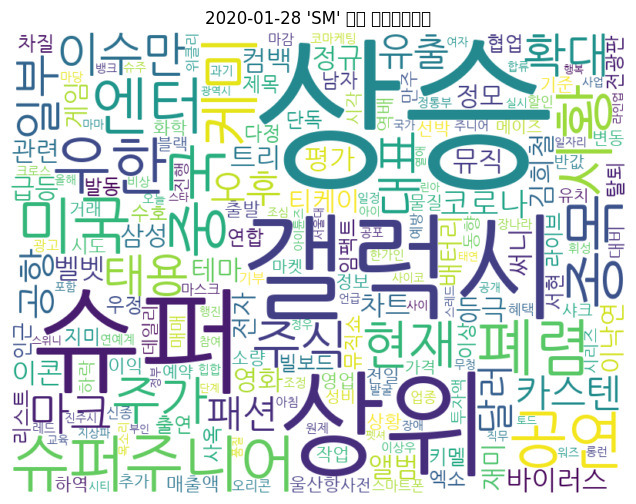


📆 2020-03-20 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2020.03.20&de=2020.03.21&nso=so:r,p:from20200320to20200321,a:all&start=41


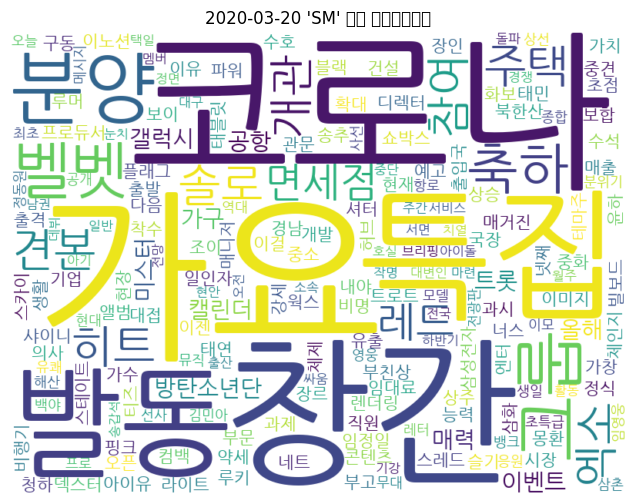


📆 2020-07-22 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2020.07.22&de=2020.07.23&nso=so:r,p:from20200722to20200723,a:all&start=41


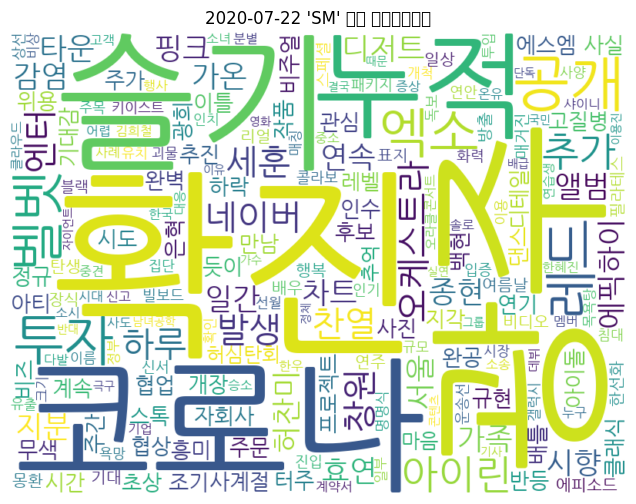


📆 2020-08-21 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2020.08.21&de=2020.08.22&nso=so:r,p:from20200821to20200822,a:all&start=41


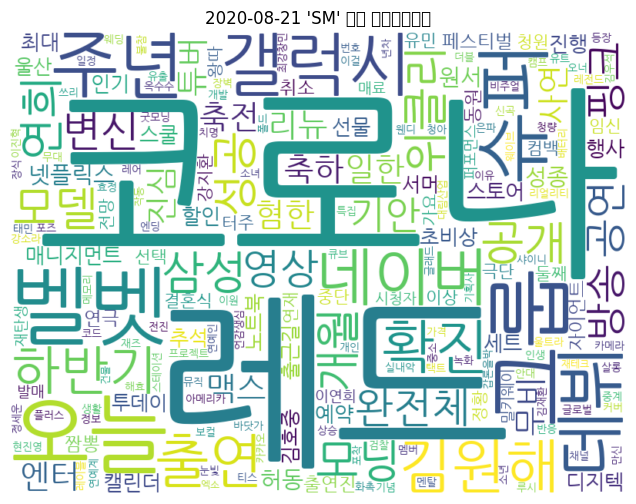


📆 2020-10-05 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2020.10.05&de=2020.10.06&nso=so:r,p:from20201005to20201006,a:all&start=41


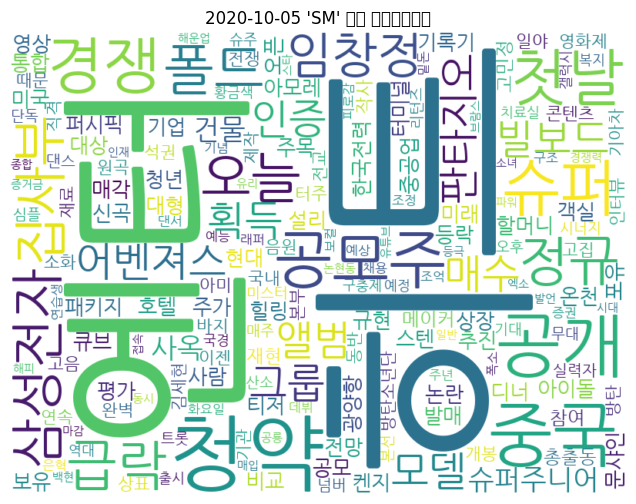


📆 2021-03-12 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.03.12&de=2021.03.13&nso=so:r,p:from20210312to20210313,a:all&start=41


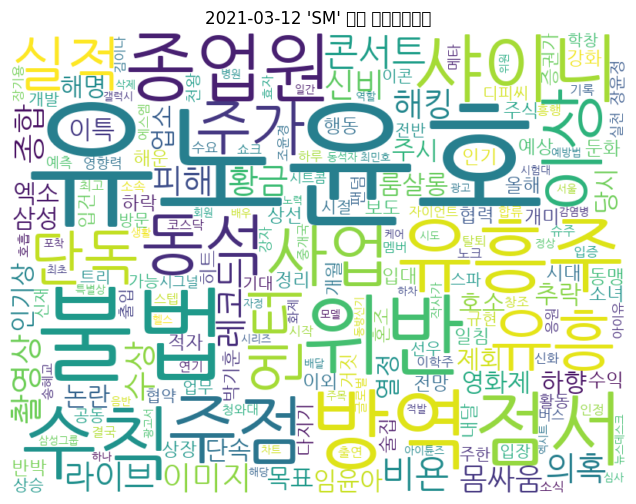


📆 2021-06-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.06.04&de=2021.06.05&nso=so:r,p:from20210604to20210605,a:all&start=41


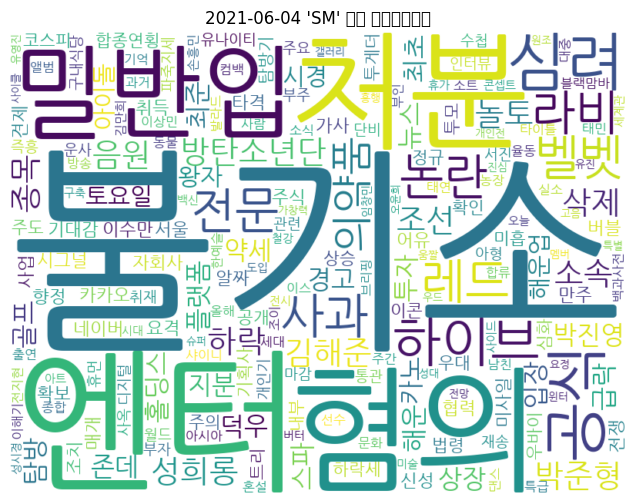


📆 2021-06-08 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.06.08&de=2021.06.09&nso=so:r,p:from20210608to20210609,a:all&start=41


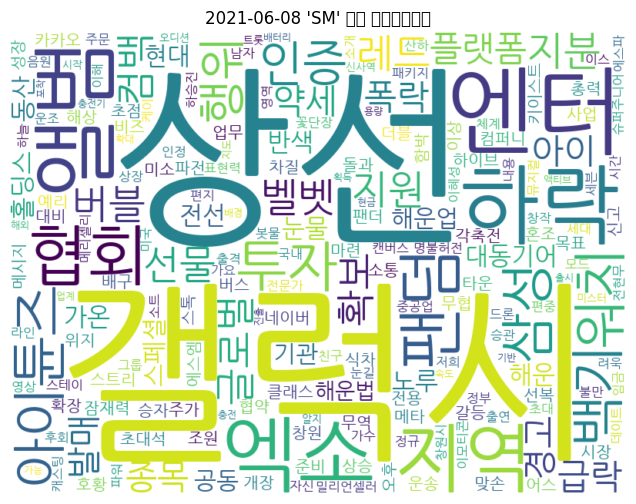


📆 2021-10-07 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.10.07&de=2021.10.08&nso=so:r,p:from20211007to20211008,a:all&start=41


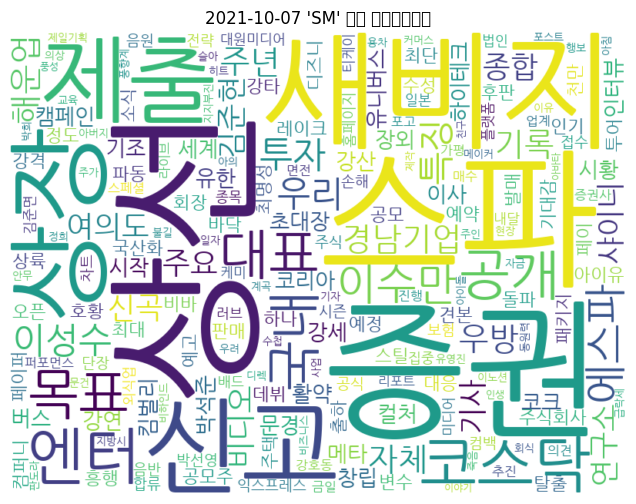


📆 2021-10-18 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.10.18&de=2021.10.19&nso=so:r,p:from20211018to20211019,a:all&start=41


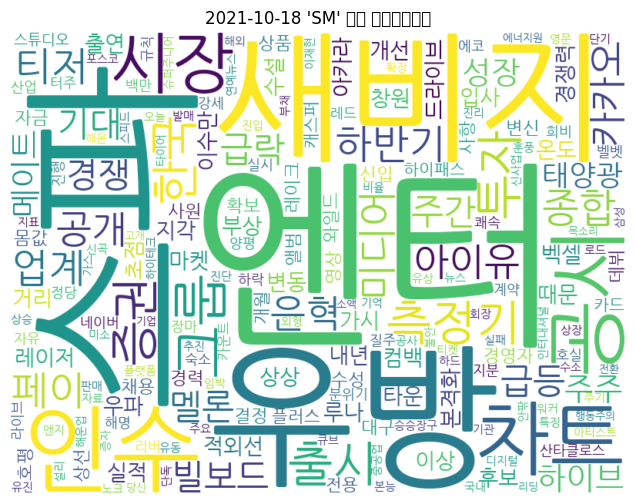


📆 2021-10-28 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.10.28&de=2021.10.29&nso=so:r,p:from20211028to20211029,a:all&start=41


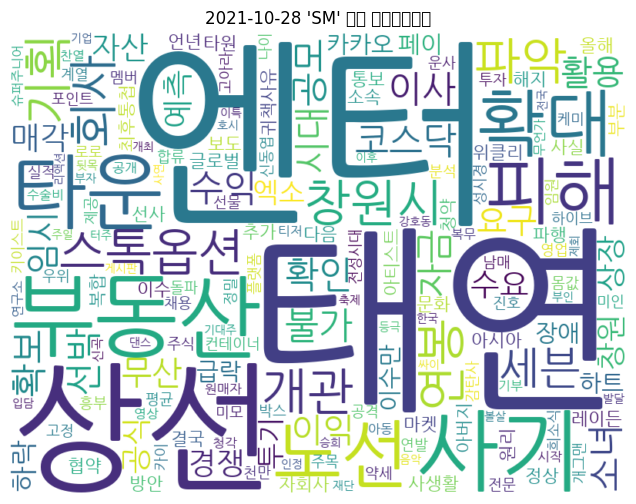


📆 2021-11-18 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2021.11.18&de=2021.11.19&nso=so:r,p:from20211118to20211119,a:all&start=41


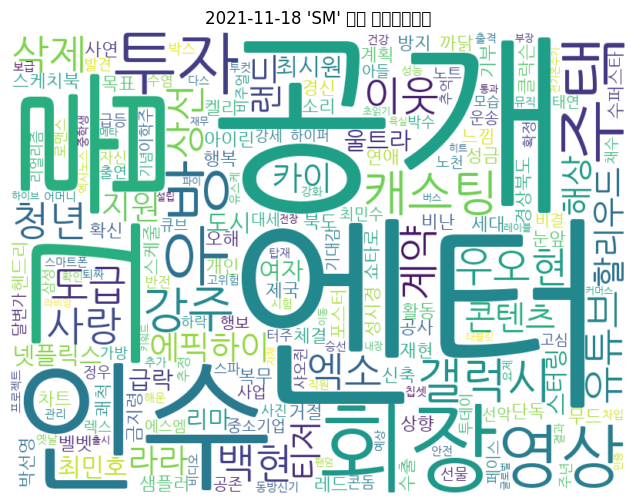


📆 2022-03-17 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.03.17&de=2022.03.18&nso=so:r,p:from20220317to20220318,a:all&start=41


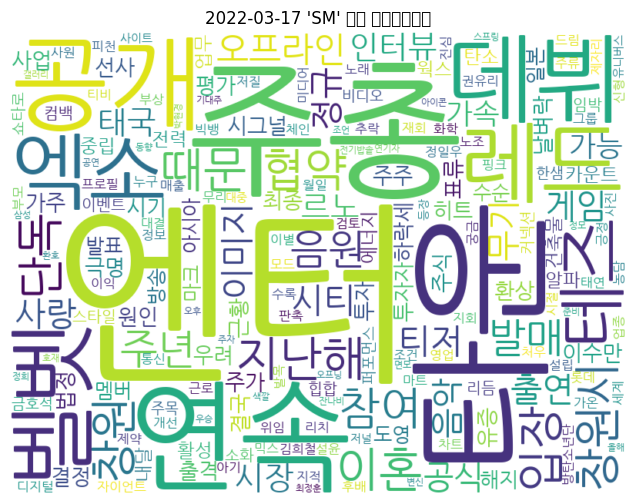


📆 2022-04-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.04.04&de=2022.04.05&nso=so:r,p:from20220404to20220405,a:all&start=41


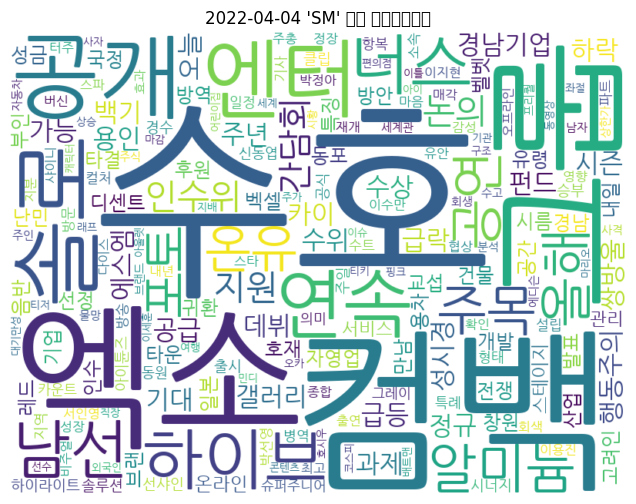


📆 2022-04-18 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.04.18&de=2022.04.19&nso=so:r,p:from20220418to20220419,a:all&start=41


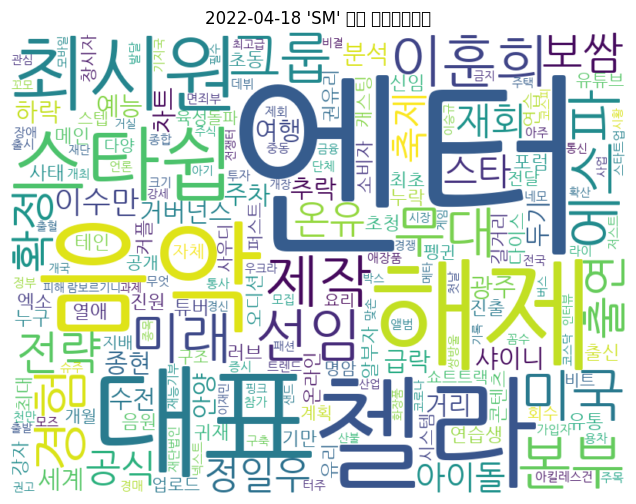


📆 2022-05-09 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.05.09&de=2022.05.10&nso=so:r,p:from20220509to20220510,a:all&start=41


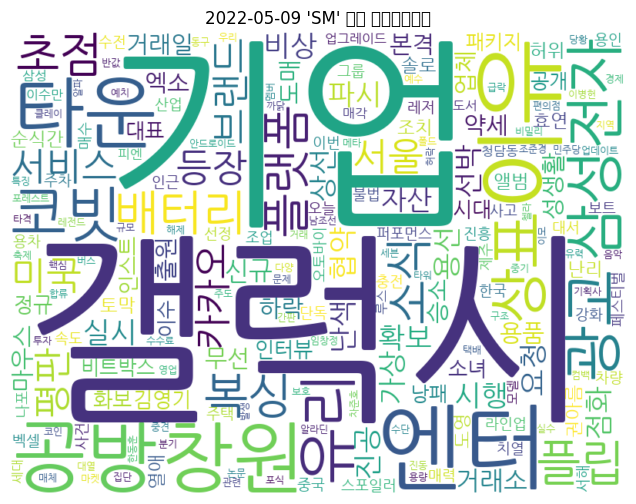


📆 2022-08-17 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.08.17&de=2022.08.18&nso=so:r,p:from20220817to20220818,a:all&start=41


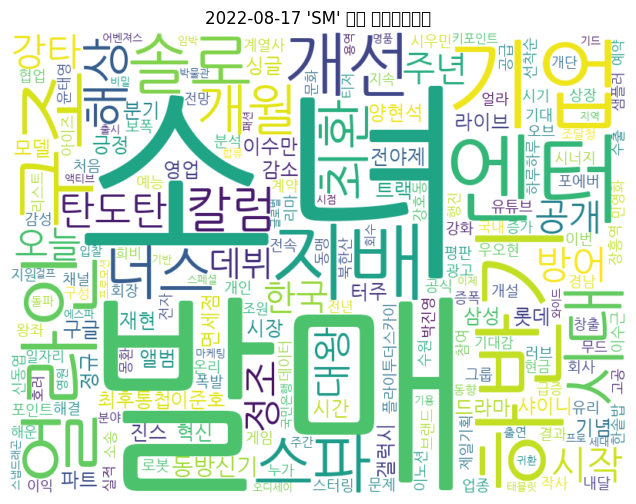


📆 2022-11-01 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2022.11.01&de=2022.11.02&nso=so:r,p:from20221101to20221102,a:all&start=41


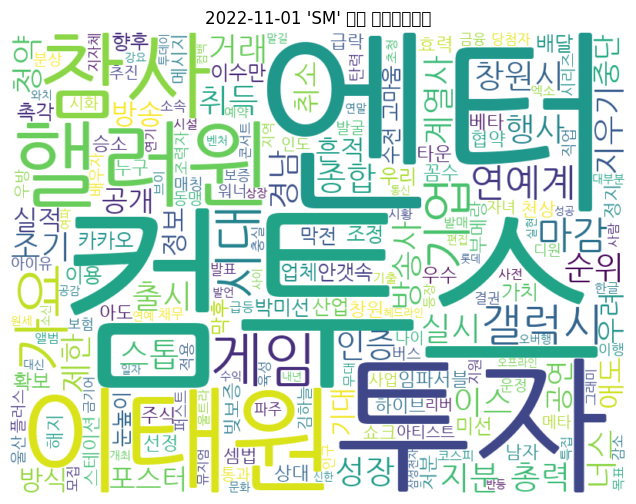


📆 2023-01-25 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.01.25&de=2023.01.26&nso=so:r,p:from20230125to20230126,a:all&start=41


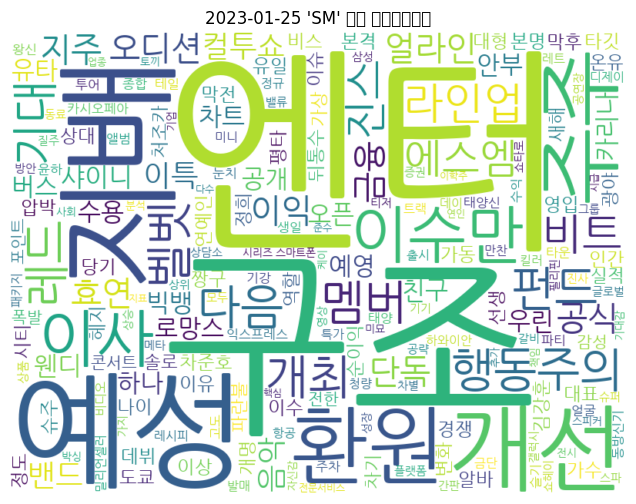


📆 2023-02-20 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.02.20&de=2023.02.21&nso=so:r,p:from20230220to20230221,a:all&start=41


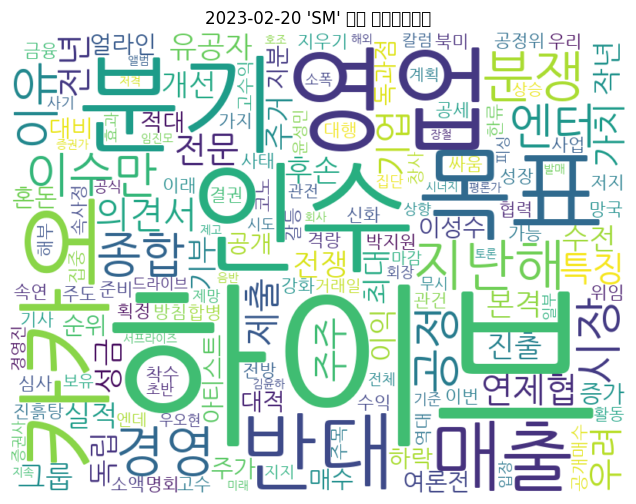


📆 2023-03-13 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.03.13&de=2023.03.14&nso=so:r,p:from20230313to20230314,a:all&start=41


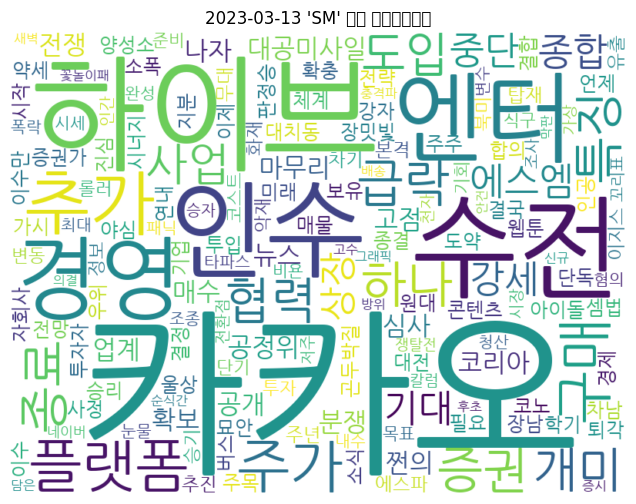


📆 2023-03-27 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.03.27&de=2023.03.28&nso=so:r,p:from20230327to20230328,a:all&start=41


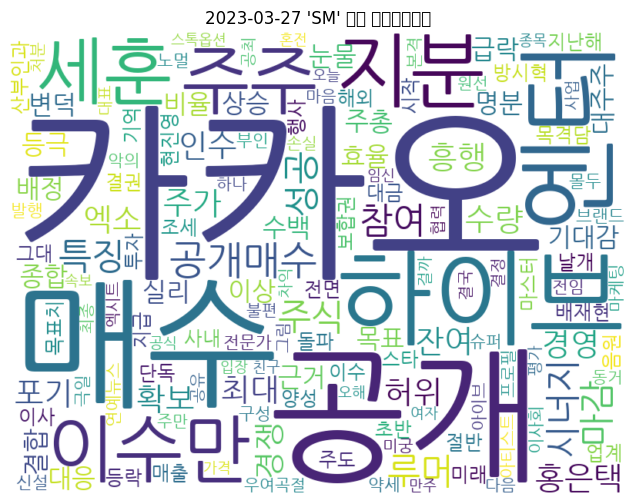


📆 2023-06-01 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.06.01&de=2023.06.02&nso=so:r,p:from20230601to20230602,a:all&start=41


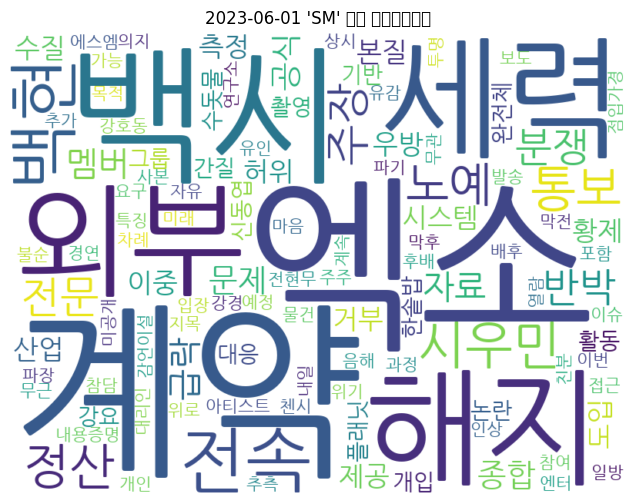


📆 2023-11-13 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2023.11.13&de=2023.11.14&nso=so:r,p:from20231113to20231114,a:all&start=41


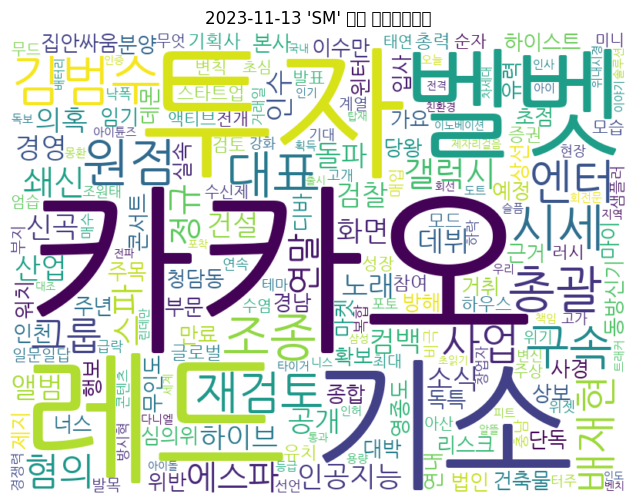


📆 2024-01-12 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.01.12&de=2024.01.13&nso=so:r,p:from20240112to20240113,a:all&start=41


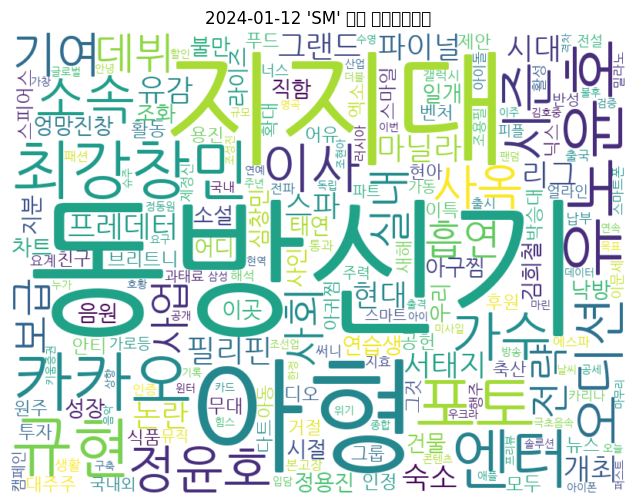


📆 2024-01-16 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.01.16&de=2024.01.17&nso=so:r,p:from20240116to20240117,a:all&start=41


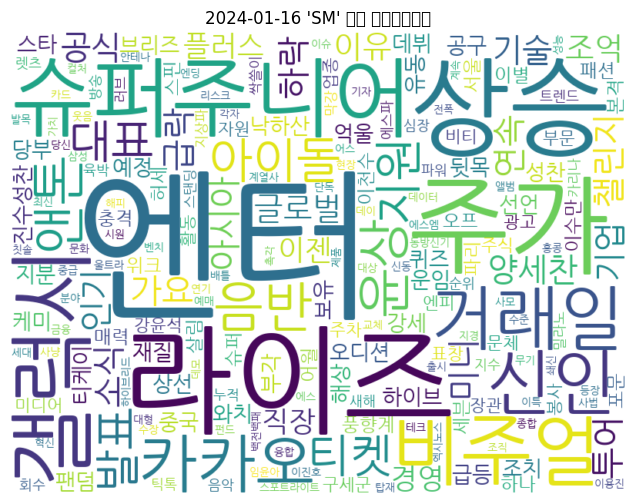


📆 2024-03-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.03.04&de=2024.03.05&nso=so:r,p:from20240304to20240305,a:all&start=41


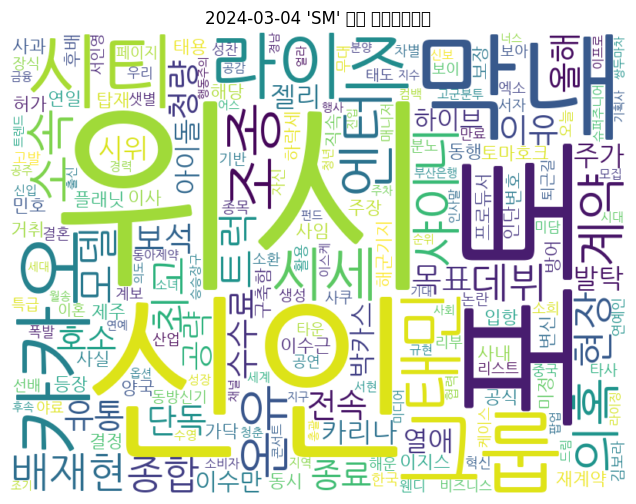


📆 2024-04-01 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.04.01&de=2024.04.02&nso=so:r,p:from20240401to20240402,a:all&start=41


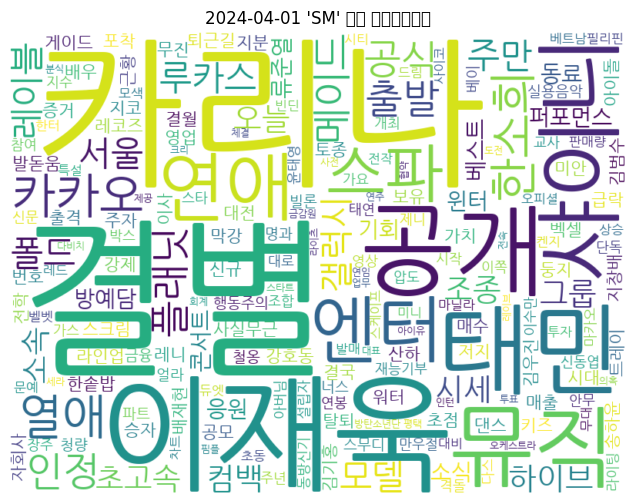


📆 2024-05-28 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.05.28&de=2024.05.29&nso=so:r,p:from20240528to20240529,a:all&start=41


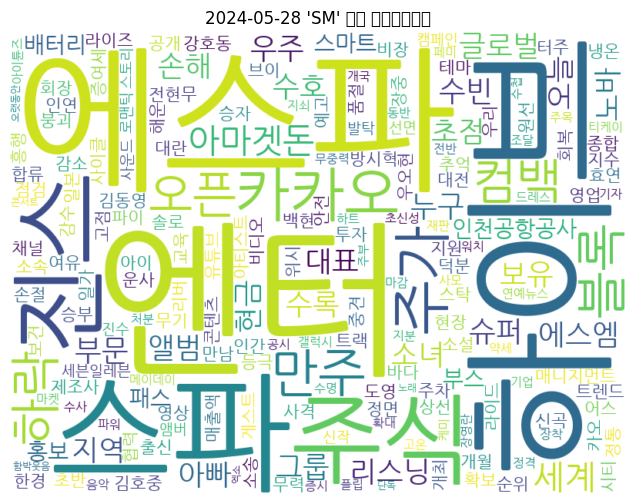


📆 2024-06-04 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.06.04&de=2024.06.05&nso=so:r,p:from20240604to20240605,a:all&start=41


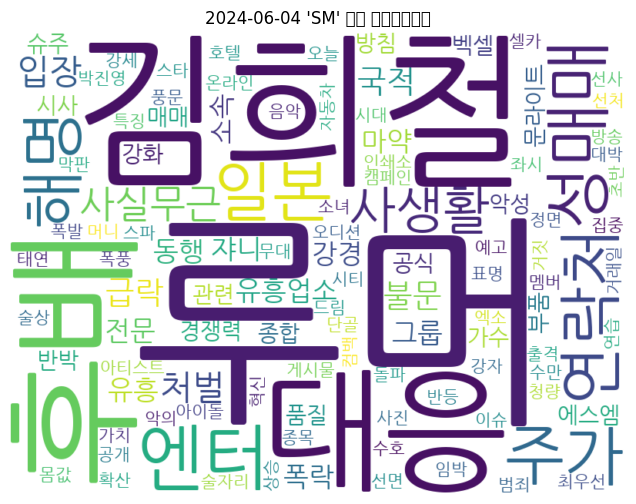


📆 2024-08-09 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.08.09&de=2024.08.10&nso=so:r,p:from20240809to20240810,a:all&start=41


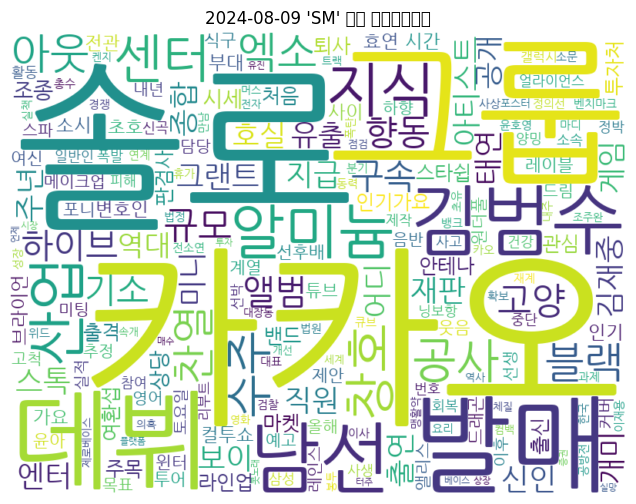


📆 2024-11-12 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.11.12&de=2024.11.13&nso=so:r,p:from20241112to20241113,a:all&start=41


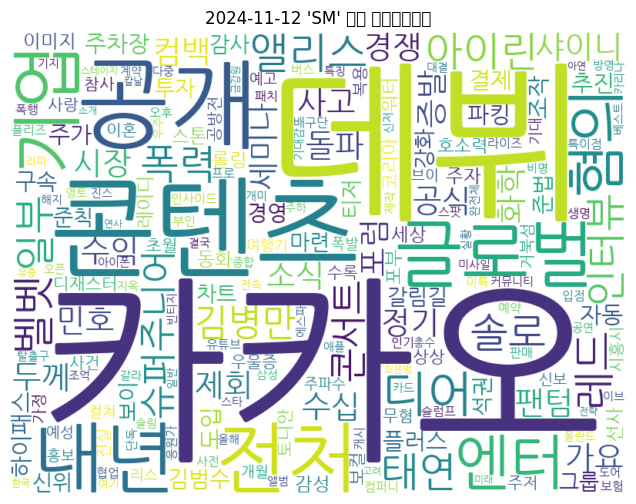


📆 2024-12-03 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2024.12.03&de=2024.12.04&nso=so:r,p:from20241203to20241204,a:all&start=41


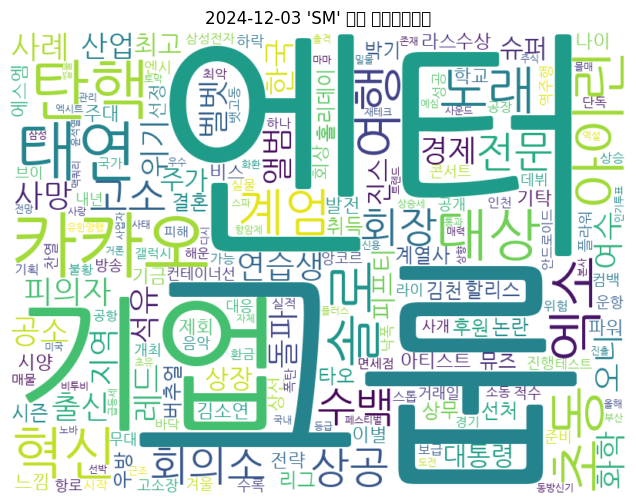


📆 2025-01-02 - 50개의 뉴스 제목 수집 완료
예시 URL: https://search.naver.com/search.naver?where=news&query=SM&sort=0&ds=2025.01.02&de=2025.01.03&nso=so:r,p:from20250102to20250103,a:all&start=41


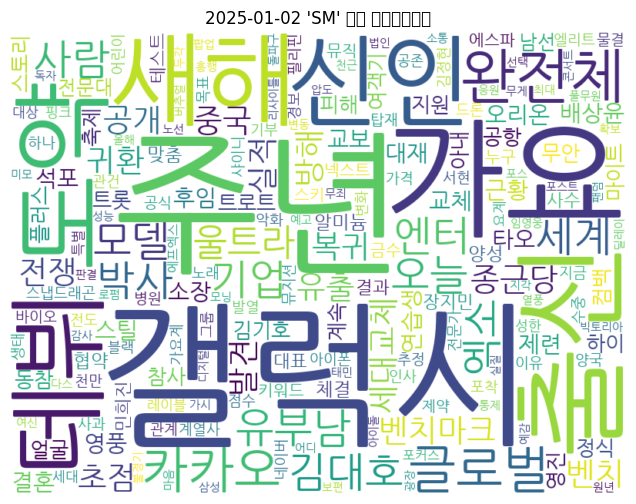

In [14]:
# 🔍 검색 키워드 설정
keyword = "SM"
pages = 5
word_dict = {}

# 🔁 이벤트 날짜별 워드클라우드 생성
for start_date in event_dates['event_date']:
    end_date = start_date + timedelta(days=1)
    start_str = start_date.strftime("%Y.%m.%d")
    end_str = end_date.strftime("%Y.%m.%d")

    titles = []

    # ▼ 뉴스 제목 수집
    for page in range(1, pages * 10, 10):
        url = (
            f"https://search.naver.com/search.naver"
            f"?where=news&query={urllib.parse.quote(keyword)}"
            f"&sort=0&ds={start_str}&de={end_str}&nso=so:r,p:from{start_date.strftime('%Y%m%d')}to{end_date.strftime('%Y%m%d')},a:all"
            f"&start={page}"
        )
        headers = {"User-Agent": "Mozilla/5.0"}
        resp = requests.get(url, headers=headers)
        soup = BeautifulSoup(resp.text, "html.parser")

        for title_tag in soup.select("a.news_tit"):
            titles.append(title_tag['title'])

        time.sleep(1.2)

    print(f"\n📆 {start_date.date()} - {len(titles)}개의 뉴스 제목 수집 완료")
    print("예시 URL:", url)

    # ▼ 텍스트 전처리
    text = " ".join(titles)
    text = re.sub(r"[^\uAC00-\uD7A3\s]", "", text)  # 한글과 공백만 남기기

    # ▼ 형태소 분석 (명사 추출)
    mecab = Mecab()
    nouns = mecab.nouns(text)
    nouns = [n for n in nouns if len(n) > 1]

    word_freq = Counter(nouns)
    word_dict[start_date] = word_freq

    # ▼ 워드클라우드 생성
    wc = WordCloud(
        font_path='C:\\Users\\chica\\AppData\\Local\\Microsoft\\Windows\\Fonts\\NanumGothic.ttf',
        background_color="white",
        width=800,
        height=600
    )
    wc.generate_from_frequencies(word_freq)

    # ▼ 출력
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{start_date.date()} '{keyword}' 뉴스 워드클라우드")
    plt.show()

### 3. 아이돌 관련된 사건이 있는지 확인

뽑아둔 이벤트 날짜와 word_dict에 소속사 아이돌 그룹이 있는 날짜 개수 비교

만약 거의 동일하다면 그들이 어떤 영향을 주었을 것이라고 판단

In [16]:
# word_dict에서 특정 키워드 포함된 날짜만 추출
suspicious_keywords = ['동방신기', '슈퍼주니어', '소녀시대', '샤이니', '엑소', '레드벨벳','NCT', '에스파', '라이즈', '하츠투하츠']
flagged_dates = []

for date, freq in word_dict.items():
    if any(word in freq for word in suspicious_keywords):
        flagged_dates.append(date)

len(flagged_dates)

47

### 4. 이벤트별 기사 제목 크롤링

거의 동일(50개 -> 47개)하기 때문에 그들에 대한 어떤 기사가 나왔는지 크롤링을 통해 확인한다.

개인 아티스트에 대한 뉴스여도 그룹명이 대부분 붙기 때문에 그룹 키워드 리스트를 순회하며 서치한다.

`옵션`

(1) 검색어 서치 후, 상위 10개 기사 수집

(2) 검색어 서치 후, 제목에 검색어 단어가 그대로 들어가 있는 기사만 수집-채택예정

> (1) 검색어 서치 후, 상위 10개 기사 수집

In [17]:
import requests
from bs4 import BeautifulSoup
from datetime import timedelta
import urllib.parse
import time

# 이벤트 날짜 리스트
dates = event_dates['event_date']

# 소속 아티스트 키워드 리스트
suspicious_keywords = ['동방신기', '슈퍼주니어', '소녀시대', '샤이니', '엑소', '레드벨벳','NCT', '에스파', '라이즈', '하츠투하츠']

# 유저 에이전트 설정
headers = {"User-Agent": "Mozilla/5.0"}

# 결과 저장
results = {}

for date in dates:
    end_date = date + timedelta(days=1)
    start_str = date.strftime("%Y.%m.%d")
    end_str = end_date.strftime("%Y.%m.%d")
    date_result = {}

    for keyword in suspicious_keywords:
        titles = []

        # 1페이지 (최대 10개 기사만)
        url = (
            f"https://search.naver.com/search.naver"
            f"?where=news&query={urllib.parse.quote(keyword)}"
            f"&sort=0&ds={start_str}&de={end_str}"
            f"&nso=so:r,p:from{date.strftime('%Y%m%d')}to{end_date.strftime('%Y%m%d')},a:all"
            f"&start=1"
        )

        resp = requests.get(url, headers=headers)
        soup = BeautifulSoup(resp.text, "html.parser")
        for tag in soup.select("a.news_tit"):
            titles.append(tag['title'])

        if titles:  # 기사 하나라도 있으면 저장
            date_result[keyword] = titles[:10]

        time.sleep(1.2)  # 차단 방지

    results[date] = date_result

# 결과 출력
for date, keywords in results.items():
    print(f"\n📆 {date.date()} - 아티스트별 뉴스 요약")
    if not keywords:
        print("  📭 해당 날짜에 아티스트 관련 뉴스 없음")
        continue
    for artist, titles in keywords.items():
        print(f"\n[{artist}] - {len(titles)}개 기사")
        for i, title in enumerate(titles, 1):
            print(f"{i}. {title}")



📆 2014-05-15 - 아티스트별 뉴스 요약

[동방신기] - 10개 기사
1. 동방신기 슈주 엑소까지 '최악의 SM 분쟁'
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 동방신기·슈주·엑소…SM 반복되는 소송전 이유는
4. SM엔터테인먼트 또 송사, 이번에는 '엑소' 중국인 크리스
5. 엑소 크리스, SM 상대 전속계약무효소송 논란…동방신기, 슈주와 평행이론?
6. '엑소' 크리스, SM 상대로 소송…'포스트 동방신기', 악몽도 닮아가나
7. 엑소 크리스, SM상대로 전속계약 무효소송… “동방신기 떠올라”
8. [AJU TV] 엑소 크리스 SM 소송 '동방신기 따라가나?' 영상보니…
9. 엑소 크리스 소송, 네티즌 "HOT 동방신기 한경 등 왜 유독 SM만…"
10. 동방신기·슈주 이어 엑소까지…SM 전속 분쟁 이어져

[슈퍼주니어] - 10개 기사
1. 엑소 크리스 SM 소송, '슈퍼주니어' 한경 뒤 잇나
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 엑소 크리스, SM 이탈?…과거 슈퍼주니어 '한경' 탈퇴 이유 '재조명'
4. '슈퍼주니어M' 동해 헨리, 굿나잇 셀카 포즈 '깜찍'
5. SM엔터테인먼트 또 송사, 이번에는 '엑소' 중국인 크리스
6. 동방신기 슈주 엑소까지 '최악의 SM 분쟁'
7. 동방신기·슈주·엑소…SM 반복되는 소송전 이유는
8. 엑소 크리스 소송, 그칠 기세 안보여 ‘되살아난 악몽’
9. 남느냐 떠나느냐..엑소 크리스 복귀 가능성은?
10. 엑소 크리스, 15일 SM 상대로 전속 계약해지 소송…"무슨 일?"

[소녀시대] - 10개 기사
1. [SS포토] 소녀시대 윤아 공항패션, '화보가 따로 있나?'
2. [화제포착] 하정우·소녀시대 숲…팬들의 선물
3. [경인포토]소녀시대 윤아, 공항 밝히는 눈부신 자태
4. 소녀시대 써니, 생일 맞아 팬들에게 ‘써니 숲’ 선물 받았다
5. 소녀시대 여행 인증샷, 수영-제시카-효연 개성 넘치는 인증샷에 ‘예뻐’
6. 소녀시대 써니, 선물

> (2) 검색어 서치 후, 제목에 검색어 단어가 그대로 들어가 있는 기사만 수집

In [ ]:
import requests
from bs4 import BeautifulSoup
from datetime import timedelta
import urllib.parse
import time

# 이벤트 날짜 리스트
dates = event_dates['event_date']

# 소속 아티스트 키워드 리스트
suspicious_keywords = ['동방신기', '슈퍼주니어', '소녀시대', '샤이니', '엑소', '레드벨벳','NCT', '에스파', '라이즈', '하츠투하츠']

# 유저 에이전트 설정
headers = {"User-Agent": "Mozilla/5.0"}

# 결과 저장
results = {}

for date in dates:
    end_date = date + timedelta(days=1)
    start_str = date.strftime("%Y.%m.%d")
    end_str = end_date.strftime("%Y.%m.%d")
    date_result = {}

    for keyword in suspicious_keywords:
        titles = []

        # 1페이지 (최대 10개 기사만)
        url = (
            f"https://search.naver.com/search.naver"
            f"?where=news&query={urllib.parse.quote(keyword)}"
            f"&sort=0&ds={start_str}&de={end_str}"
            f"&nso=so:r,p:from{date.strftime('%Y%m%d')}to{end_date.strftime('%Y%m%d')},a:all"
            f"&start=1"
        )

        resp = requests.get(url, headers=headers)
        soup = BeautifulSoup(resp.text, "html.parser")

        for tag in soup.select("a.news_tit"):
            title = tag['title']
            if keyword in title:  # 🔥 실제 제목에 키워드가 포함된 경우만 저장
                titles.append(title)

        if titles:  # 제목이 1개라도 있으면 저장
            date_result[keyword] = titles[:10]

        time.sleep(1.2)  # 차단 방지

    results[date] = date_result

# 결과 출력
for date, keywords in results.items():
    print(f"\n📆 {date.date()} - 아티스트별 뉴스 요약")
    if not keywords:
        print("  📭 해당 날짜에 아티스트 관련 뉴스 없음")
        continue
    for artist, titles in keywords.items():
        print(f"\n[{artist}] - {len(titles)}개 기사")
        for i, title in enumerate(titles, 1):
            print(f"{i}. {title}")


📆 2014-05-15 - 아티스트별 뉴스 요약

[동방신기] - 9개 기사
1. 동방신기 슈주 엑소까지 '최악의 SM 분쟁'
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 동방신기·슈주·엑소…SM 반복되는 소송전 이유는
4. 엑소 크리스, SM 상대 전속계약무효소송 논란…동방신기, 슈주와 평행이론?
5. '엑소' 크리스, SM 상대로 소송…'포스트 동방신기', 악몽도 닮아가나
6. 엑소 크리스, SM상대로 전속계약 무효소송… “동방신기 떠올라”
7. [AJU TV] 엑소 크리스 SM 소송 '동방신기 따라가나?' 영상보니…
8. 엑소 크리스 소송, 네티즌 "HOT 동방신기 한경 등 왜 유독 SM만…"
9. 동방신기·슈주 이어 엑소까지…SM 전속 분쟁 이어져

[슈퍼주니어] - 4개 기사
1. 엑소 크리스 SM 소송, '슈퍼주니어' 한경 뒤 잇나
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 엑소 크리스, SM 이탈?…과거 슈퍼주니어 '한경' 탈퇴 이유 '재조명'
4. '슈퍼주니어M' 동해 헨리, 굿나잇 셀카 포즈 '깜찍'

[소녀시대] - 10개 기사
1. [SS포토] 소녀시대 윤아 공항패션, '화보가 따로 있나?'
2. [화제포착] 하정우·소녀시대 숲…팬들의 선물
3. [경인포토]소녀시대 윤아, 공항 밝히는 눈부신 자태
4. 소녀시대 써니, 생일 맞아 팬들에게 ‘써니 숲’ 선물 받았다
5. 소녀시대 여행 인증샷, 수영-제시카-효연 개성 넘치는 인증샷에 ‘예뻐’
6. 소녀시대 써니, 선물&먹방 인증샷… 숲과 도시락 선물에 ‘팬 자부심 가득’
7. 류현진 하지원, 다저스타디움 도킹..소녀시대 이어 여배우까지
8. 엠파이어 ‘그런 애 아니야’, 악동뮤지션-소녀시대 압도하며 멜론차트 1위
9. 소녀시대 수영, 걸그룹 체면 잊은 빵 먹방 ‘폭소’
10. 소녀시대 수영-서현 근황, 상반된 매력… 민낯에도 빛나는 ‘여신 미모’

[샤이니] - 2개 기사
1. 이영표의 청춘토크쇼 참석한 샤이니 민호
2. 이영표, 건국

아래거 일부 안됨. 다시 돌려봄.

In [6]:
import requests
from bs4 import BeautifulSoup
from datetime import timedelta, datetime
import urllib.parse
import time, random

# 이벤트 날짜 리스트
dates = event_dates['event_date']

# 소속 아티스트 키워드 리스트
suspicious_keywords = ['동방신기', '슈퍼주니어', '소녀시대', '샤이니', '엑소', '레드벨벳','NCT', '에스파', '라이즈', '하츠투하츠']

# 유저 에이전트 설정
headers = {"User-Agent": "Mozilla/5.0"}

# 결과 저장
results = {}

# 기준일 설정 (2023-01-01 이후)
base_date = datetime(2023, 1, 1)

for date in dates:
    if date < base_date:
        continue  # 2023년 이전 날짜는 건너뛰기

    end_date = date + timedelta(days=1)
    start_str = date.strftime("%Y.%m.%d")
    end_str = end_date.strftime("%Y.%m.%d")
    date_result = {}

    for keyword in suspicious_keywords:
        titles = []

        # 1페이지 (최대 10개 기사만)
        url = (
            f"https://search.naver.com/search.naver"
            f"?where=news&query={urllib.parse.quote(keyword)}"
            f"&sort=0&ds={start_str}&de={end_str}"
            f"&nso=so:r,p:from{date.strftime('%Y%m%d')}to{end_date.strftime('%Y%m%d')},a:all"
            f"&start=1"
        )

        resp = requests.get(url, headers=headers)
        soup = BeautifulSoup(resp.text, "html.parser")

        for tag in soup.select("a.news_tit"):
            title = tag['title']
            if keyword in title:
                titles.append(title)

        if titles:
            date_result[keyword] = titles[:10]

        time.sleep(random.uniform(2, 3))

    results[date] = date_result

# 결과 출력
for date, keywords in results.items():
    print(f"\n📆 {date.date()} - 아티스트별 뉴스 요약")
    if not keywords:
        print("  📭 해당 날짜에 아티스트 관련 뉴스 없음")
        continue
    for artist, titles in keywords.items():
        print(f"\n[{artist}] - {len(titles)}개 기사")
        for i, title in enumerate(titles, 1):
            print(f"{i}. {title}")



📆 2023-01-25 - 아티스트별 뉴스 요약

[동방신기] - 1개 기사
1. "카시오페아 모여라"…동방신기, 2월 생일파티 연다

[슈퍼주니어] - 5개 기사
1. “보는 내내 뭉클” 디즈니+ ‘슈퍼주니어’ 다큐 뜨거운 호평 잇달아
2. 슈퍼주니어 예성, 솔로 정규 1집 타이틀곡 'Small Things' 컴백
3. '연중플러스' 슈퍼주니어 예성 '개릴라데이트' 출연, 예성 "아버지 우울증에 강아지 입양 결심" (2)
4. 슈퍼주니어 예성, 써클차트 1월 25일 리테일 앨범차트 1위 39,608장, NCT 드림·슈퍼주니어·웨이션브이·슈퍼주니어 예성 TOP5…최다앨범 차트진입은 세븐틴
5. 슈퍼주니어 예성, 반려견 꼬밍X부모님 '연중 플러스' 출연

[소녀시대] - 3개 기사
1. 나얼 '발라드 팝 시티' 프로젝트 두 번째 주인공은 '소녀시대' 태연
2. 소녀시대 유리, 쉿 비밀이에요 (출국)[뉴스엔TV]
3. 유리 닮은 게 아니라 소녀시대 유리가 맞았네 [한혁승의 포톡]

[샤이니] - 8개 기사
1. [가요소식] 샤이니 온유, 3월 국내 첫 솔로 콘서트
2. 주지훈, 샤이니 멤버 합류? 최민호 "평균연령 높아졌다"('두발로 티켓팅')
3. 샤이니 민호, 열정 눈빛[포토엔HD]
4. 샤이니 키, ‘킬러’로 돌아온다
5. 샤이니·르세라핌·아이브 '케이팝 다큐' 출연... 케이팝 제너레이션 1회 공개 언제?
6. '더 패뷸러스' 박희정 "샤이니 민호와 촬영 모든게 긴장..많이 배려해줘" [인터뷰①]
7. 샤이니 민호, 숨길 수 없는 멋진 눈맞춤 (출국)[뉴스엔TV]
8. 샤이니 키부터 김충재·나난...스피커 '토끼展' 내달 개막

[엑소] - 3개 기사
1. ‘100억대’ 멜론 스트리밍, BTS가 유일…아이유·임영웅·엑소는 몇번?
2. [제32회 서울가요대상 SMA] 엑소 수호(EXO SUHO) '한류 대상 소감'
3. 엑소 카이, 찰나를 진하게 그리는 잔상

[레드벨벳] - 9개 기사
1. 레드벨벳, 미니 '버스데이'로 첫 밀리언셀러
2. 레드벨벳 웬디X

time 늘려서 안된부분만 다시하니까 되길래, 늘려서 전체 다시 해보는중

In [ ]:
import requests
from bs4 import BeautifulSoup
from datetime import timedelta
import urllib.parse
import time, random

# 이벤트 날짜 리스트
dates = event_dates['event_date']

# 소속 아티스트 키워드 리스트
suspicious_keywords = ['동방신기', '슈퍼주니어', '소녀시대', '샤이니', '엑소', '레드벨벳','NCT', '에스파', '라이즈', '하츠투하츠']

# 유저 에이전트 설정
headers = {"User-Agent": "Mozilla/5.0"}

# 결과 저장
results = {}

for date in dates:
    end_date = date + timedelta(days=1)
    start_str = date.strftime("%Y.%m.%d")
    end_str = end_date.strftime("%Y.%m.%d")
    date_result = {}

    for keyword in suspicious_keywords:
        titles = []

        # 1페이지 (최대 10개 기사만)
        url = (
            f"https://search.naver.com/search.naver"
            f"?where=news&query={urllib.parse.quote(keyword)}"
            f"&sort=0&ds={start_str}&de={end_str}"
            f"&nso=so:r,p:from{date.strftime('%Y%m%d')}to{end_date.strftime('%Y%m%d')},a:all"
            f"&start=1"
        )

        resp = requests.get(url, headers=headers)
        soup = BeautifulSoup(resp.text, "html.parser")

        for tag in soup.select("a.news_tit"):
            title = tag['title']
            if keyword in title:  # 🔥 실제 제목에 키워드가 포함된 경우만 저장
                titles.append(title)

        if titles:  # 제목이 1개라도 있으면 저장
            date_result[keyword] = titles[:10]

        time.sleep(random.uniform(2, 3))

    results[date] = date_result

# 결과 출력
for date, keywords in results.items():
    print(f"\n📆 {date.date()} - 아티스트별 뉴스 요약")
    if not keywords:
        print("  📭 해당 날짜에 아티스트 관련 뉴스 없음")
        continue
    for artist, titles in keywords.items():
        print(f"\n[{artist}] - {len(titles)}개 기사")
        for i, title in enumerate(titles, 1):
            print(f"{i}. {title}")


📆 2014-05-15 - 아티스트별 뉴스 요약

[동방신기] - 10개 기사
1. 동방신기 슈주 엑소까지 '최악의 SM 분쟁'
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 동방신기·슈주·엑소…SM 반복되는 소송전 이유는
4. SM엔터테인먼트 또 송사, 이번에는 '엑소' 중국인 크리스
5. 엑소 크리스, SM 상대 전속계약무효소송 논란…동방신기, 슈주와 평행이론?
6. '엑소' 크리스, SM 상대로 소송…'포스트 동방신기', 악몽도 닮아가나
7. 엑소 크리스, SM상대로 전속계약 무효소송… “동방신기 떠올라”
8. [AJU TV] 엑소 크리스 SM 소송 '동방신기 따라가나?' 영상보니…
9. 엑소 크리스 소송, 네티즌 "HOT 동방신기 한경 등 왜 유독 SM만…"
10. 동방신기·슈주 이어 엑소까지…SM 전속 분쟁 이어져

[슈퍼주니어] - 10개 기사
1. 엑소 크리스 SM 소송, '슈퍼주니어' 한경 뒤 잇나
2. 엑소 크리스, SM과 계약 분쟁…동방신기·슈퍼주니어는 어땠나?
3. 엑소 크리스, SM 이탈?…과거 슈퍼주니어 '한경' 탈퇴 이유 '재조명'
4. '슈퍼주니어M' 동해 헨리, 굿나잇 셀카 포즈 '깜찍'
5. SM엔터테인먼트 또 송사, 이번에는 '엑소' 중국인 크리스
6. 동방신기 슈주 엑소까지 '최악의 SM 분쟁'
7. 동방신기·슈주·엑소…SM 반복되는 소송전 이유는
8. 엑소 크리스 소송, 그칠 기세 안보여 ‘되살아난 악몽’
9. 남느냐 떠나느냐..엑소 크리스 복귀 가능성은?
10. 엑소 크리스, 15일 SM 상대로 전속 계약해지 소송…"무슨 일?"

[소녀시대] - 10개 기사
1. [SS포토] 소녀시대 윤아 공항패션, '화보가 따로 있나?'
2. [화제포착] 하정우·소녀시대 숲…팬들의 선물
3. [경인포토]소녀시대 윤아, 공항 밝히는 눈부신 자태
4. 소녀시대 써니, 생일 맞아 팬들에게 ‘써니 숲’ 선물 받았다
5. 소녀시대 여행 인증샷, 수영-제시카-효연 개성 넘치는 인증샷에 ‘예뻐’
6. 소녀시대 써니, 선물

### 5. 이벤트별 기사 제목 크롤링 데이터 저장 

In [ ]:
import pandas as pd

# 저장할 리스트 생성
rows = []

for date, artist_dict in results.items():
    for artist, titles in artist_dict.items():
        rows.append({
            '날짜': date.date(),
            '아티스트': artist,
            '기사 수': len(titles),
            '기사 제목 리스트': titles
        })

# 데이터프레임으로 변환
df_results = pd.DataFrame(rows)

# 엑셀 또는 CSV로 저장 (둘 중 택 1)
df_results.to_excel("뉴스_아티스트별_요약.xlsx", index=False)
# df_results.to_csv("뉴스_아티스트별_요약.csv", index=False, encoding='utf-8-sig')


### 6. (이벤트별-그룹별) 기사 요약 + 감성분석

기사요약: 어떤 그룹이 뭐때문에 영향을 미쳤는지 결정

감성분석: 결과적으로 해당 이벤트에 어떤 그룹이 영향을 미쳤는지 결정

### 7. 기사 요약 텍스트 유사도 기반 클러스터링 후 라벨링

모든 소속사 데이터 지금 6단계까지 수집 후 진행 예정

### 8. 이벤트 스터디 분석

각 이벤트별 AR, CAR 산출

그룹별 평균 AR/CAR 산출, [모든 소속사 데이터]기사요약 텍스트 유사도 군집별 평균 AR/CAR 산출 등등..

통계적 검정


In [ ]:
# 수정 테스트